# MCMC yield pertubation analysis

The goal of this investigation is to fit for the combination of yields which best represents APOGEE trends using our multizone model results.
Because the abundance evolution of each element is *linear in yields*, we can predict the present-day properties for new combinations of yields. This notebook focuses on the MCMC methods (likelihoods, binning, etc) to understand what works well and the model sensativity. The scientific comparisons and models are instead in the notebook `perturb_results` and in the models `pertubations/mcmc_analysis`.  



## Background

**Abundance Linearity lemma:**
Assume we know the yields for several different processes $y^{i}$ and we know (or calculate) the resulting evolution for each process $Z^{i}(t)$. For any linear combination of $p$ processes $\{\alpha_i\}_{i \in 1...p} \in \mathbb{R}$, if the total yield of the process we are interested in is 

$$
y = \sum_i \alpha_i y^i
$$
Then the resulting abundance evolution is
$$
Z_X(t) = \sum_{i} \alpha_i Z_X^i(t)
$$

Note that if the metallicity evolution changes and the yields depend on metallicity, than this does not hold. However, to first order, we can use the above property of chemical evolution to understand the space of yields which best reproduces the present day APOGEE measurements.


### Modeling linear combinations.

To most approprietly model each linear combination, I take our fiducial model and use Ag as a dummy element. Each model has the same seed so reproduces exactly the same pattern of stars. 

Additionally, to minimize the impacts on the metallicity evolution, I scale each process down by a factor of $10^6$ and the solar metallicity for each process down by the corresponding amount. Therefore, for a 1x amount of each process, the reported ratios of \[X/H\] accurately correspond to $Z_{\rm C}^{\rm proc}$. For best practice, each combination of models is best ran on the same vice run, so adding more components is as simple as extending the yield correspondance table above.

### Organization

This notebook is fairly long and moderately complex. As such, there are some conventions with each step of the notebook.




In [1]:
using CairoMakie
using Arya

In [2]:
using CSV, DataFrames
import CategoricalArrays: cut
using StatsBase
using OrderedCollections

In [3]:
using Turing
import NaNMath as nm
using LinearAlgebra: diagm
using PairPlots

In [4]:
import DensityEstimators: bin_indices

In [5]:
using AdvancedMH
import FillArrays: I
using Measurements

## Utilities & Defaults

In [6]:
DEFAULT_SAMPLER = NUTS(0.65)
BINS_MG_H = LinRange(-0.3, 0.3, 20)
BINS_MG_FE = LinRange(0.025, 0.25, 12)

MG_H_0 = -0.1
D_MG_H = 0.05
N_SAMPLES = 1_000

1000

In [7]:
solar_z = (;
    c = 3.39e-03,
    mg = 6.71e-04
    )

(c = 0.00339, mg = 0.000671)

In [8]:
"""
    C_Mg_to_Z(C_MG)

converts a bracket notation [C/Mg] value to the mass fraction Zc/Zmg
"""
function C_Mg_to_Z(ag_mg)
    return solar_z.c / solar_z.mg * 10 .^ ag_mg
end

C_Mg_to_Z

In [9]:
"""
    C_Mg_to_Z_relerr(C_MG)

converts an uncertanty of the bracket notation [C/Mg] value to the relative uncertanty in mass fraction Zc/Zmg
"""
function C_Mg_to_Z_relerr(ag_mg_err)
    return ag_mg_err * log(10)
end

C_Mg_to_Z_relerr

In [10]:
"""
    Mg_H_to_Z(C_MG)

converts a bracket notation [Mg/H] to mass fraction
"""
function Mg_H_to_Z(mg_h)
    return solar_z.mg * 10 .^ mg_h
end

Mg_H_to_Z

In [11]:
"""
    Z_to_C_Mg(Z)

Converts abundance ratio Zc/Zmg to [C/Mg] bracket notation
"""
function Z_to_C_Mg(z_c_mg)
    return @. nm.log10(z_c_mg / solar_z.c * solar_z.mg)
end

Z_to_C_Mg

# Setup

## Data loading

### Observational

In [12]:
subgiants = CSV.read("../../data/subgiants.csv", DataFrame)

Row,APOGEE_ID,FILE,TARGET_ID,APSTAR_ID,ASPCAP_ID,TELESCOPE,LOCATION_ID,FIELD,ALT_ID,RA,DEC,GLON,GLAT,J,J_ERR,H,H_ERR,K,K_ERR,SRC_H,WASH_M,WASH_M_ERR,WASH_T2,WASH_T2_ERR,DDO51,DDO51_ERR,IRAC_3_6,IRAC_3_6_ERR,IRAC_4_5,IRAC_4_5_ERR,IRAC_5_8,IRAC_5_8_ERR,IRAC_8_0,IRAC_8_0_ERR,WISE_4_5,WISE_4_5_ERR,TARG_4_5,TARG_4_5_ERR,WASH_DDO51_GIANT_FLAG,WASH_DDO51_STAR_FLAG,TARG_PMRA,TARG_PMDEC,TARG_PM_SRC,AK_TARG,AK_TARG_METHOD,AK_WISE,SFD_EBV,APOGEE_TARGET1,APOGEE_TARGET2,APOGEE2_TARGET1,APOGEE2_TARGET2,APOGEE2_TARGET3,APOGEE2_TARGET4,TARGFLAGS,SURVEY,PROGRAMNAME,NVISITS,SNR,SNREV,STARFLAG,STARFLAGS,ANDFLAG,ANDFLAGS,VHELIO_AVG,VSCATTER,VERR,RV_TEFF,RV_LOGG,RV_FEH,RV_ALPHA,RV_CARB,RV_CHI2,RV_CCFWHM,RV_AUTOFWHM,RV_FLAG,N_COMPONENTS,MEANFIB,SIGFIB,MIN_H,MAX_H,MIN_JK,MAX_JK,GAIAEDR3_SOURCE_ID,GAIAEDR3_PARALLAX,GAIAEDR3_PARALLAX_ERROR,GAIAEDR3_PMRA,GAIAEDR3_PMRA_ERROR,GAIAEDR3_PMDEC,GAIAEDR3_PMDEC_ERROR,GAIAEDR3_PHOT_G_MEAN_MAG,GAIAEDR3_PHOT_BP_MEAN_MAG,GAIAEDR3_PHOT_RP_MEAN_MAG,GAIAEDR3_DR2_RADIAL_VELOCITY,GAIAEDR3_DR2_RADIAL_VELOCITY_ERROR,GAIAEDR3_R_MED_GEO,GAIAEDR3_R_LO_GEO,GAIAEDR3_R_HI_GEO,GAIAEDR3_R_MED_PHOTOGEO,GAIAEDR3_R_LO_PHOTOGEO,GAIAEDR3_R_HI_PHOTOGEO,⋯
,String31,String,String,String,String,String15,Int64,String31,String31,Float64,Float64,Float64,Float64,Float64?,Float64?,Float64,Float64?,Float64?,Float64?,String15,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Int64,Int64,Float64,Float64,String31,Float64?,String31,Float64?,Float64?,Int64,Int64,Int64,Int64,Int64,Int64,String,String,String,Int64,Float64,Float64,Int64,String,Int64,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,⋯
1,b'2M00002185+1459100',b'apStar-dr17-2M00002185+1459100.fits',b'apo25m.107-46_MGA.2M00002185+1459100',b'apogee.apo25m.stars.107-46_MGA.2M00002185+1459100',b'apogee.apo25m.synspec_fix.107-46_MGA.2M00002185+1459100',b'apo25m',2897,b'107-46_MGA',b'none',0.091079,14.9861,105.0,-46.0997,11.755,0.024,11.262,0.03,11.189,0.024,b'2MASS',13.5706,0.0074611,12.3912,0.0137692,13.5794,0.00529872,missing,missing,missing,missing,missing,missing,missing,missing,11.206,0.02,11.206,0.02,0,1,16.6,-11.8,b'URAT1',0.00550778,b'RJCE_WISE',0.00550778,0.038957,0,0,-2147383280,0,0,0,"b'APOGEE2_WISE_DERED,APOGEE2_SHORT,APOGEE2_MANGA_LED,APOGEE2_ONEBIN_GT_0_3'",b'manga-apogee2',b'manga',2,73.0973,56.319,2048,b'PERSIST_LOW',2048,b'PERSIST_LOW',-2.19023,0.201405,0.0445209,5527.86,4.17737,-0.360521,0.0,0.0,2.96882,20.406,18.0563,0,1,25.0,0.0,7.0,11.5,0.3,9999.99,2771996223829700224,1.05283,0.0167047,13.0831,0.0181976,-14.4923,0.0111624,13.1303,13.5894,12.5045,missing,missing,912.563,897.341,925.024,913.201,899.736,931.864,⋯
2,b'2M00004159+6505249',b'apStar-dr17-2M00004159+6505249.fits',b'apo25m.117+01.2M00004159+6505249',b'apogee.apo25m.stars.117+01.2M00004159+6505249',b'apogee.apo25m.synspec_fix.117+01.2M00004159+6505249',b'apo25m',4591,b'117+01',b'none',0.173321,65.0903,117.618,2.74346,12.436,0.024,11.678,0.031,11.488,0.023,b'2MASS',missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,11.363,0.021,11.357,0.021,-1,1,10.0,-10.0,b'NOMAD',0.248778,b'RJCE_WISE_ALLSKY',0.24327,missing,-2147481584,0,0,0,0,0,"b'APOGEE_WISE_DERED,APOGEE_SHORT'",b'apogee',b'apogee',4,119.858,116.336,4,b'BRIGHT_NEIGHBOR',0,b'',-18.2297,0.180933,0.0400975,4997.62,3.73543,0.356047,0.0,0.0,7.6692,21.4947,17.9231,0,1,232.264,51.264,7.0,12.2,0.5,9999.99,432165592222544128,0.936677,0.0211397,11.214,0.0209121,-6.08822,0.024862,15.0524,16.1868,14.0106,missing,missing,1027.28,1004.31,1047.85,1033.09,1008.41,1057.8,⋯
3,b'2M00004251+5643075',b'apStar-dr17-2M00004251+5643075.fits',b'apo25m.NGC778

In [13]:
subgiants[!, :z_c] = C_Mg_to_Z(subgiants.C_MG)
subgiants[!, :z_c_err] =  C_Mg_to_Z_relerr(subgiants.C_MG_ERR) .* subgiants.z_c

14066-element Vector{Float64}:
 0.43698719663298985
 0.20345362019138907
 0.34382117020192554
 0.38176869014135145
 0.33544176148432214
 0.405016714741612
 0.30320383458583855
 0.49953838380511656
 0.2145384896320434
 0.42868392066169164
 0.4912685921817806
 0.3670099339178731
 0.3025017476477631
 ⋮
 0.3136943767321309
 0.31512383708318237
 0.4896397981542085
 0.3135520756761523
 0.3559466469003436
 0.3966854346391929
 0.3758600803634905
 0.4196575430450733
 0.5734712464746712
 0.2312034202531327
 0.3604281210195957
 0.21467228321360338

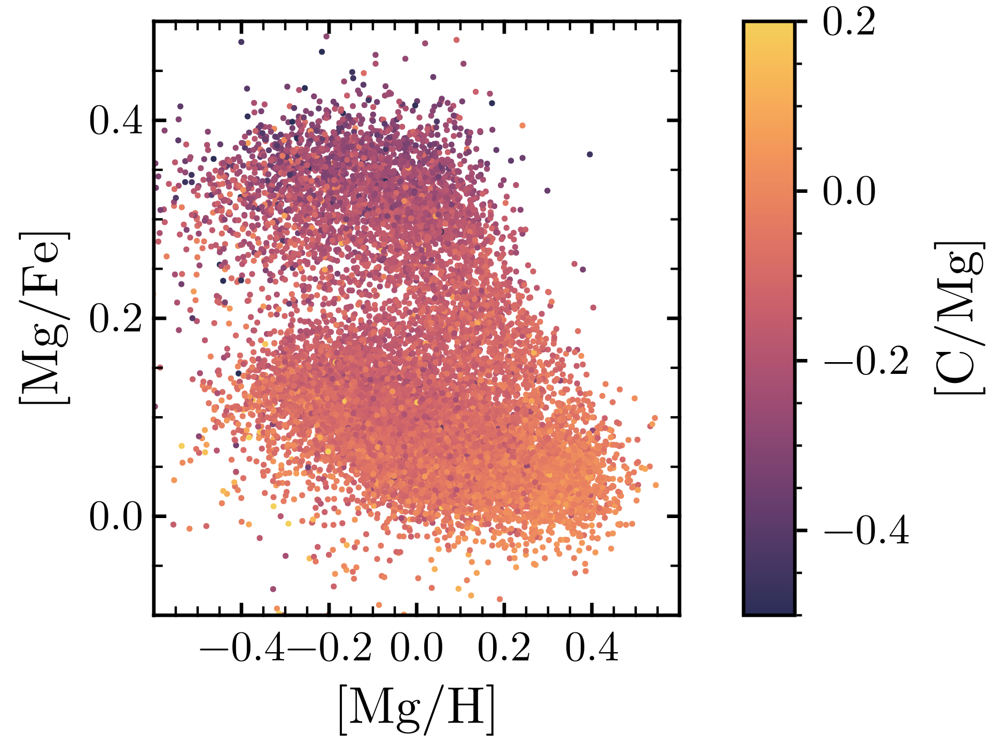

In [14]:
fig = Figure()
ax = Axis(fig[1, 1], 
    xlabel="[Mg/H]",
    ylabel="[Mg/Fe]",
    limits=(-0.6, 0.6, -0.1, 0.5)
    )


p = scatter!(subgiants.MG_H, subgiants.MG_FE, color=subgiants.C_MG, markersize = 2., colorrange=(-0.5, 0.2))

Colorbar(fig[1, 2], p, label="[C/Mg]")

fig

The above scatter plot visualizes the space which subgiant observations occupy. The low alpha sequence (low \[Mg/Fe\]) occupies a region between metallicities of -0.4 and 0.4. Almost all stars have \[Mg/Fe\] between 0 and 0.4. The vertical slice we use for the bins in \[Mg/Fe\] is at -0.1 which spans this entire range as well.

### Models

In [15]:
"""
    find_model(modelname; errorstrength)

Returns a DataFrame of the model (from the parent directory) loaded in from the sampled `stars.csv` 
nearby APOGEE-like stars dataframe.
Adds a column `z_c` which contains the abundance mass fraction ratio of AG / MG (assuming AG is the proxy
element for the model)
"""
function find_model(name; error_strength=0)
    file_name = "../../models/perturbations/$name/stars.csv"
    model =  CSV.read(file_name, DataFrame)

    N = size(model, 1)
    
    if error_strength > 0
        model[:, "AG_MG"] .+= error_strength .* model.C_MG_err .* randn(N)        
        model[:, "MG_H"] = model.MG_H_true .+ error_strength .* model.MG_H_err .* randn(N)        
        model[:, "MG_FE"] = model.MG_FE_true .+ error_strength .* model.MG_FE_err .* randn(N)        
    end
    
    model[!, "z_c"] = C_Mg_to_Z(model[:, "AG_MG"])

    return model
end

find_model

In [16]:
function load_all_models(;error_strength=0)
    model_y0_cc = find_model("const_cc", error_strength=error_strength)
    model_A_cc = find_model("quadratic", error_strength=error_strength)
    model_zeta = find_model("linear", error_strength=error_strength)
    model_alpha = find_model("analytic", error_strength=error_strength)
    model_zeta.z_c .-= model_y0_cc.z_c .* 2 # corrects offset
    
    models = Dict(
        :alpha => model_alpha,
        :zeta0 => model_y0_cc,
        :zeta1 => model_zeta,
        :zeta2 => model_A_cc,
        )
    return models
end

load_all_models (generic function with 1 method)

In [17]:
models = load_all_models()

Dict{Symbol, DataFrame} with 4 entries:
  :alpha => 14066×42 DataFrame…
  :zeta1 => 14066×42 DataFrame…
  :zeta2 => 14066×42 DataFrame…
  :zeta0 => 14066×42 DataFrame…

In [18]:
models_obs_scatter = load_all_models(error_strength=1)

Dict{Symbol, DataFrame} with 4 entries:
  :alpha => 14066×42 DataFrame…
  :zeta1 => 14066×42 DataFrame…
  :zeta2 => 14066×42 DataFrame…
  :zeta0 => 14066×42 DataFrame…

In [19]:
model_alpha = models[:alpha];

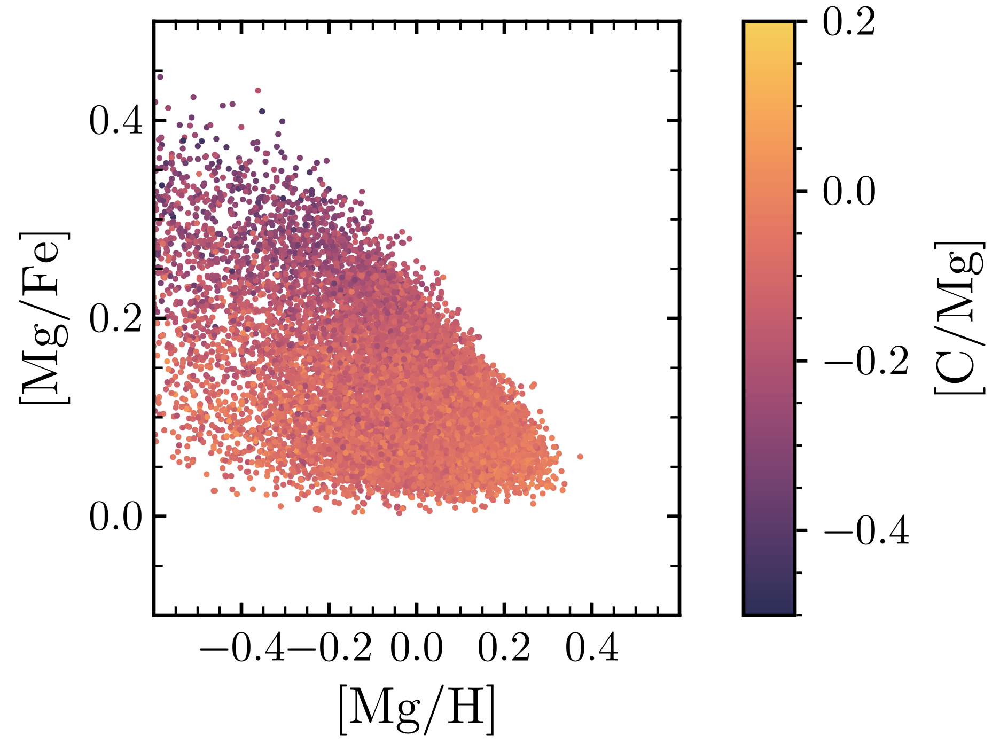

In [20]:
fig = Figure()
ax = Axis(fig[1, 1], 
    xlabel="[Mg/H]",
    ylabel="[Mg/Fe]",
    limits=(-0.6, 0.6, -0.1, 0.5)
    )


p = scatter!(model_alpha.MG_H, model_alpha.MG_FE, color=model_alpha.C_MG, markersize = 2., colorrange=(-0.5, 0.2))

Colorbar(fig[1, 2], p, label="[C/Mg]")

fig

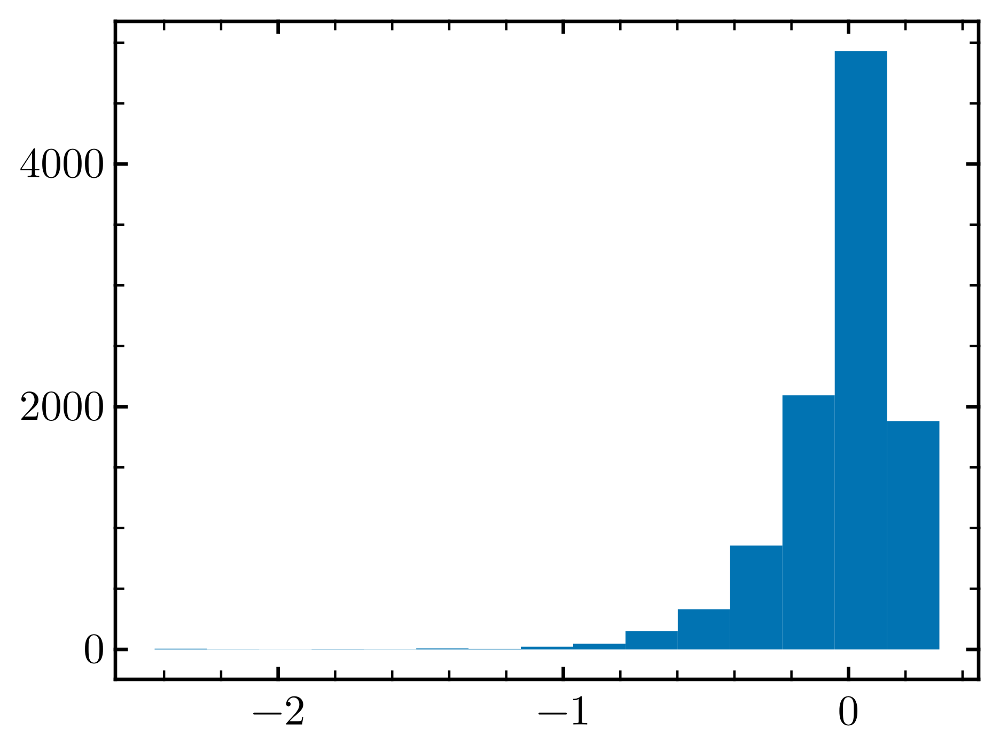

In [21]:
hist(model_alpha.MG_H_true[.!model_alpha.high_alpha])

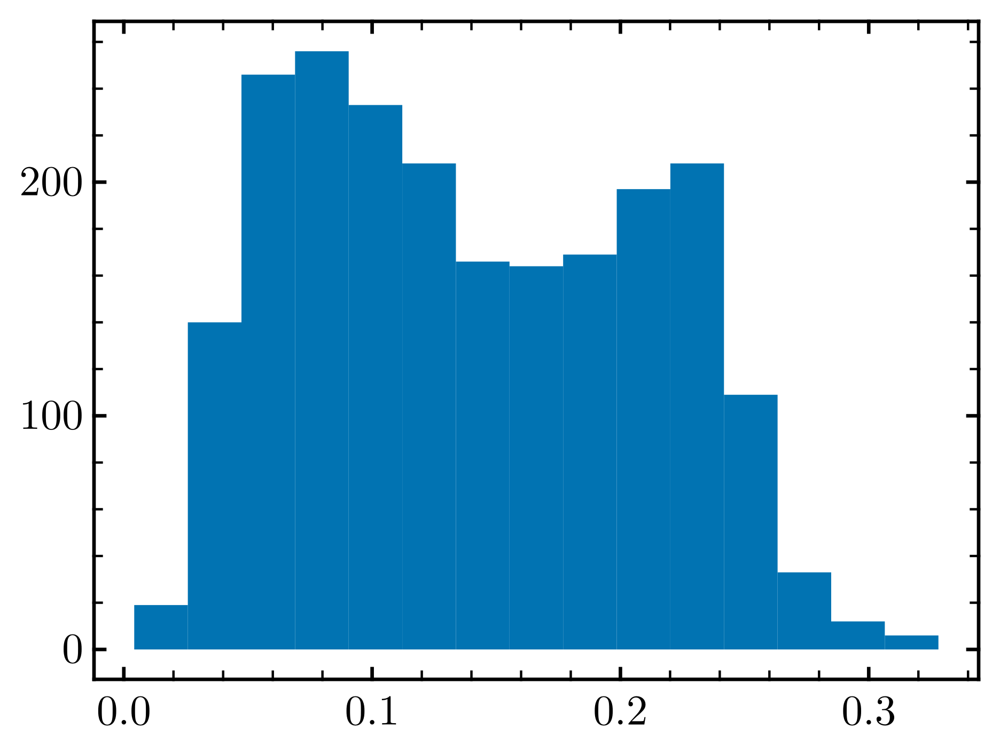

In [22]:
hist(model_alpha.MG_FE[ -0.15 .< model_alpha.MG_H .< -0.05])

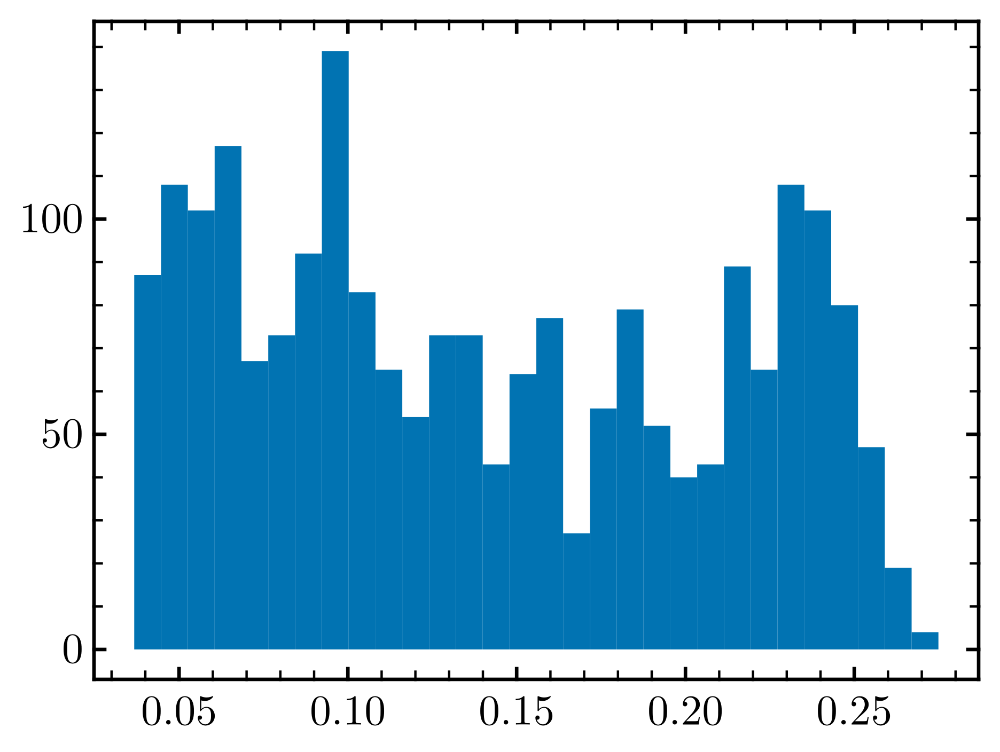

In [23]:
hist(model_alpha.MG_FE_true[ -0.15 .< model_alpha.MG_H_true .< -0.05], bins=30)

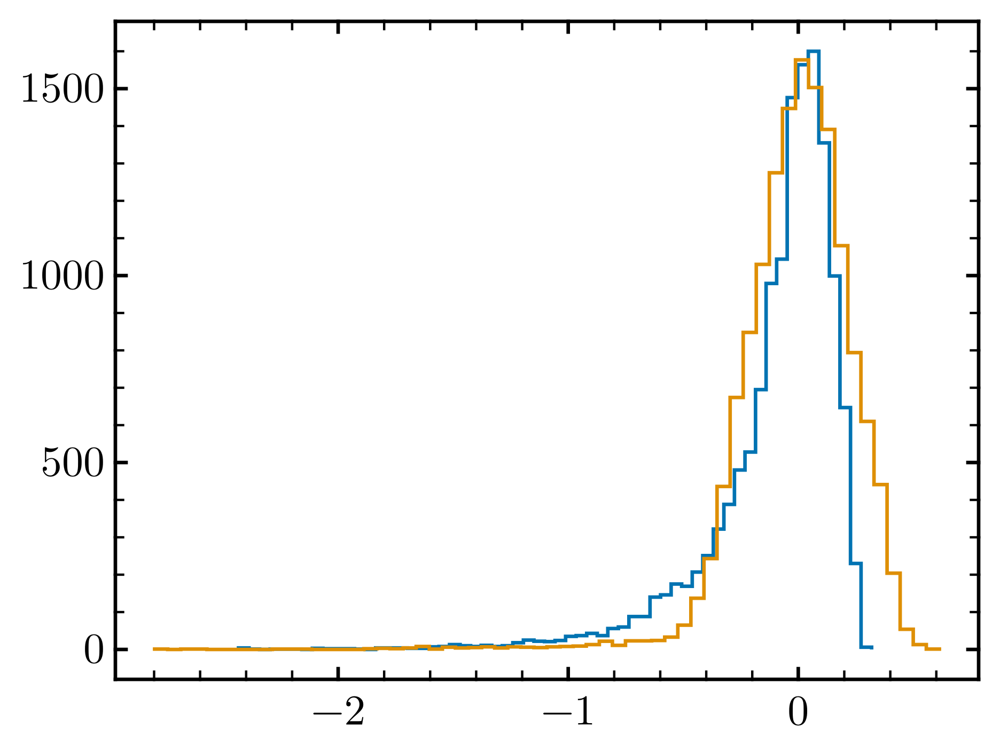

In [32]:
p, _, _ = stephist(model_alpha.MG_H_true, bins=60)
stephist!(subgiants.MG_H, bins=60)

p

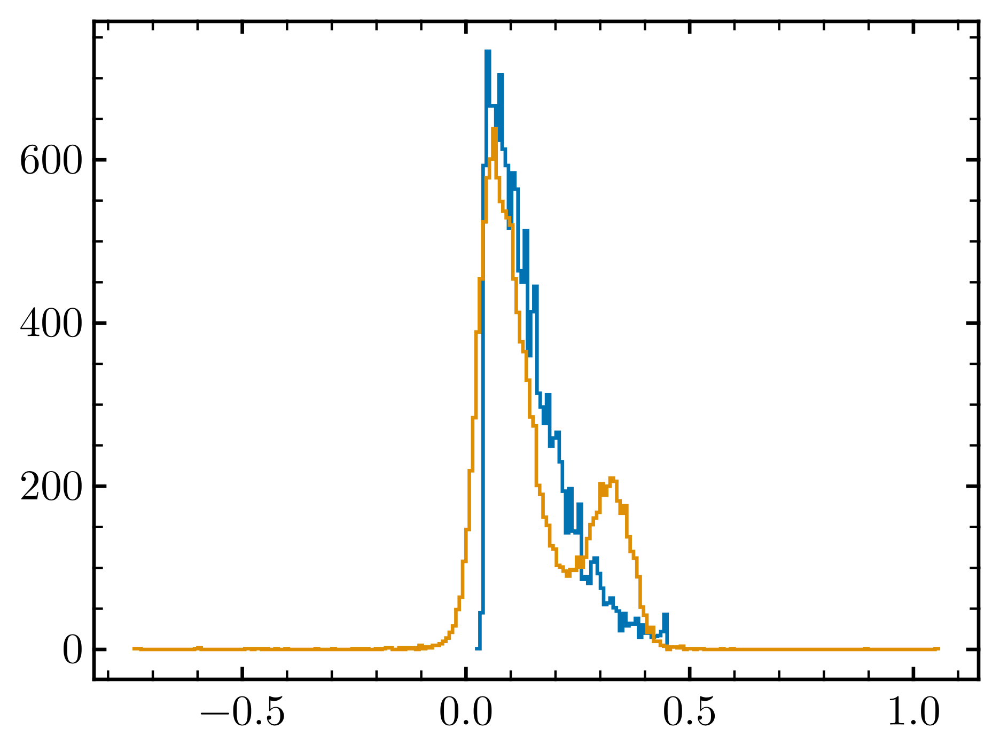

In [35]:
p, _, _ = stephist(model_alpha.MG_FE_true, bins=60)
stephist!(subgiants.MG_FE, bins=240)

p

## Binning utils

In [24]:
"""
    bin_means(df; x, bins, value, n_min)

Returns a dataframe which, for each bin in key `x`, contains columns for the mean of `val` (`med`), the 
standard deviation of `val` (`err`), the number of values in the bin `counts` and the mean in `x` (`xmed`).
"""
function bin_means(df::DataFrame; x::Symbol=:MG_H_true, bins = BINS_MG_H, val::Symbol=:z_c,)
    Nb = length(bins) - 1

    x_bin = cut(df[!, x], bins, extend=missing, labels=1:Nb)

    filt = .!ismissing.(x_bin)
    df_filtered = copy(df[filt, :])
    df_filtered[!, :x_bin] = x_bin[filt]
    grouped = groupby(df_filtered, :x_bin)

    results = combine(grouped,
        val => mean => :med,
        x => mean => :xmed,
        val => std => :err,
        val => length => :counts
    )

    full_grid = DataFrame(x_bin = 1:Nb)

    df_result = leftjoin(full_grid, results, on=:x_bin)

    x_bin_mids = midpoints(bins)
    df_result.x = x_bin_mids[df_result.x_bin]

    filt_missing = ismissing.(df_result.counts)
    df_result[filt_missing, :med] .= NaN
    df_result[filt_missing, :err] .= NaN
    df_result[filt_missing, :xmed] .= NaN

    return sort(df_result, :x_bin)
end

bin_means

In [25]:
"""
    bin_caah(df; bins, val, x, kwargs...)

Bins the dataframe in MG_H and returns the means in C_MG for low alpha stars.
Kwargs passed to bin_means
"""
function bin_caah(df::DataFrame; bins=BINS_MG_H, val=:C_MG, x=:MG_H, kwargs...)
    filt = .!df.high_alpha
    return bin_means(df[filt, :]; x=x, val=val, bins=bins, kwargs...)
end

bin_caah

In [26]:
function filter_low_alpha(df)
    return .!df.high_alpha
end

filter_low_alpha (generic function with 1 method)

In [27]:
function filter_metallicity(df; m_h=:MG_H, m_h_0=MG_H_0, d_m_h=D_MG_H)
    filt = df[:, m_h] .>= m_h_0 - d_m_h
    filt .&= df[:, m_h] .< m_h_0 + d_m_h
    return filt
end

filter_metallicity (generic function with 1 method)

In [28]:
"""
    bin_caafe(df; bins, val, x, kwargs...)

Bins the dataframe in MG_FE and returns the means in C_MG for metallicity bin.
Kwargs passed to bin_means or filter_metallicity
"""
function bin_caafe(df::DataFrame; m_h=:MG_H, m_h_0=MG_H_0, d_m_h=D_MG_H, x=:MG_FE, val=:C_MG, bins=BINS_MG_FE, kwargs...)
    filt = filter_metallicity(df, m_h=m_h, m_h_0=m_h_0, d_m_h=d_m_h)
    return bin_means(df[filt, :]; bins=bins, x=x, val=val, kwargs...)
end

bin_caafe

In [29]:
"""
    bin_zc_afe(df; bins, val, x, kwargs...)

Bins the dataframe in MG_FE and returns the means in z_c for stars in metallicity bin.
Kwargs passed to bin_means or filter_metallicity
"""
function bin_zc_afe(df::DataFrame; m_h=:MG_H_true, m_h_0=MG_H_0, d_m_h=D_MG_H,x=:MG_FE_true, val=:z_c, bins=BINS_MG_FE, kwargs...)
    filt = filter_metallicity(df, m_h=m_h, m_h_0=m_h_0, d_m_h=d_m_h)
    return bin_means(df[filt, :]; bins=bins, x=x, val=val, kwargs...)
end

bin_zc_afe

In [30]:

"""
    bin_zc_ah(df; bins, val, x, kwargs...)

Bins the dataframe in MG_H and returns the means in z_c for low alpha stars.
Kwargs passed to bin_means 
"""
function bin_zc_ah(df::DataFrame;x=:MG_H_true, val=:z_c, bins=BINS_MG_FE, kwargs...)
    filt = .!df.high_alpha
    return bin_means(df[filt, :]; bins=bins, x=x, val=val, kwargs...)
end

bin_zc_ah

In [31]:
"""
    bin_all(models, observations; kwargs...)

Given a dictionary of models (keys are model labels, read in from `find_model`) and observations (defaults to subgiants)
bins all the models and observations in the same bin.


"""
function bin_all(models, observations=subgiants;
        mg_h_bins=BINS_MG_H, mg_fe_bins=BINS_MG_FE, 
        mg_h_0=MG_H_0, d_mg_h=D_MG_H,
        n_min::Int=3,
        model_true = true,
    )

    labels = keys(models) |> collect

    ah_dfs = Dict(label => bin_zc_ah(model, bins=mg_h_bins) 
        for (label, model) in models)
    
    afe_dfs = Dict(label => bin_zc_afe(model, bins=mg_fe_bins, 
            m_h_0=mg_h_0, d_m_h=d_mg_h) 
        for (label, model) in models)

    ah_obs = bin_zc_ah(observations, bins=mg_h_bins, x=:MG_H, val=:z_c)
    afe_obs = bin_zc_afe(observations, bins=mg_fe_bins, 
        val=:z_c, x=:MG_FE, m_h=:MG_H,
            m_h_0=mg_h_0, d_m_h=d_mg_h)



    ah_binned = DataFrame([label => df.med for (label, df) in ah_dfs]...)
    afe_binned = DataFrame([label => df.med for (label, df) in afe_dfs]...)
    filt_ah = ah_obs.counts .>= n_min
    filt_afe = afe_obs.counts .>= n_min

    for label in labels
        filt_ah .&= ah_dfs[label].counts .>= n_min
        filt_afe .&= afe_dfs[label].counts .>= n_min
        
        ah_binned[:, ("$(label)_err")] = ah_dfs[label].err
        afe_binned[:, ("$(label)_err")] = afe_dfs[label].err
        ah_binned[:, ("$(label)_counts")] = ah_dfs[label].counts
        afe_binned[:, ("$(label)_counts")] = afe_dfs[label].counts
    end

    ah_binned[!, :obs] = ah_obs.med
    ah_binned[!, :obs_err] = ah_obs.err
    ah_binned[!, :obs_counts] = ah_obs.counts
    ah_binned[!, :x] = midpoints(mg_h_bins)


    @info "missing $(sum(.!filt_ah)) bins in ah"
    @info "missing $(sum(.!filt_afe)) bins in afe"
    ah_binned = disallowmissing(ah_binned[filt_ah, :])
    
    afe_binned[!, :obs] = afe_obs.med
    afe_binned[!, :obs_err] = afe_obs.err
    afe_binned[!, :obs_counts] = afe_obs.counts
    afe_binned[!, :x] = midpoints(mg_fe_bins)

    afe_binned = disallowmissing(afe_binned[filt_afe, :])


    return ah_binned, afe_binned, labels
end

bin_all

In [32]:
function plot_ah_models(ah, labels)
    fig, ax = FigAxis(
        xlabel="[Mg/H]",
        ylabel="Zc / Zmg  (for process)",
    )
    
    for label in labels
        lines!(ah.x, ah[:, label], label=string(label))
    end
    
    
    errorscatter!(ah.x, ah.obs, yerror=ah.obs_err ./ sqrt.(ah.obs_counts))
    axislegend()
    fig

end

plot_ah_models (generic function with 1 method)

In [33]:
function plot_afe_models(afe, labels)
    fig, ax = FigAxis(
        xlabel="[Mg/Fe]",
        ylabel="Zc / Zmg (for process)",
    )
    
    for label in labels
        lines!(afe.x, afe[:, label], label=string(label))
    end
    
    errorscatter!(afe.x, afe.obs , yerror=afe.obs_err ./ sqrt.(afe.obs_counts))
    
    axislegend()
    fig

end

plot_afe_models (generic function with 1 method)

In [34]:
ah, afe, labels = bin_all(models)

[ Info: missing 0 bins in ah
[ Info: missing 0 bins in afe


(19×16 DataFrame
 Row │ alpha    zeta1     zeta2      zeta0    alpha_err  alpha_counts  zeta1_e ⋯
     │ Float64  Float64   Float64    Float64  Float64    Int64         Float64 ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │ 1.61495  -2.22261  0.352415   1.53374  0.506293            190  0.07747 ⋯
   2 │ 1.50265  -2.18785  0.324161   1.53374  0.478495            197  0.07179
   3 │ 1.59239  -2.11407  0.261771   1.53374  0.479931            193  0.07721
   4 │ 1.46059  -2.07013  0.232436   1.53374  0.476803            302  0.07977
   5 │ 1.59306  -1.99358  0.176841   1.53374  0.371279            319  0.06734 ⋯
   6 │ 1.54183  -1.944    0.149154   1.53374  0.377432            394  0.06852
   7 │ 1.57061  -1.8834   0.116572   1.53374  0.33989             435  0.06372
   8 │ 1.55048  -1.81788  0.0871274  1.53374  0.309954            512  0.06517
   9 │ 1.49361  -1.77558  0.0733364  1.53374  0.314004            625  0.06051 ⋯
  10 │ 1.50398  -1.7105

In [35]:
CSV.write("mcmc_samples/ah_binned.csv", ah)
CSV.write("mcmc_samples/afe_binned.csv", afe)

"mcmc_samples/afe_binned.csv"

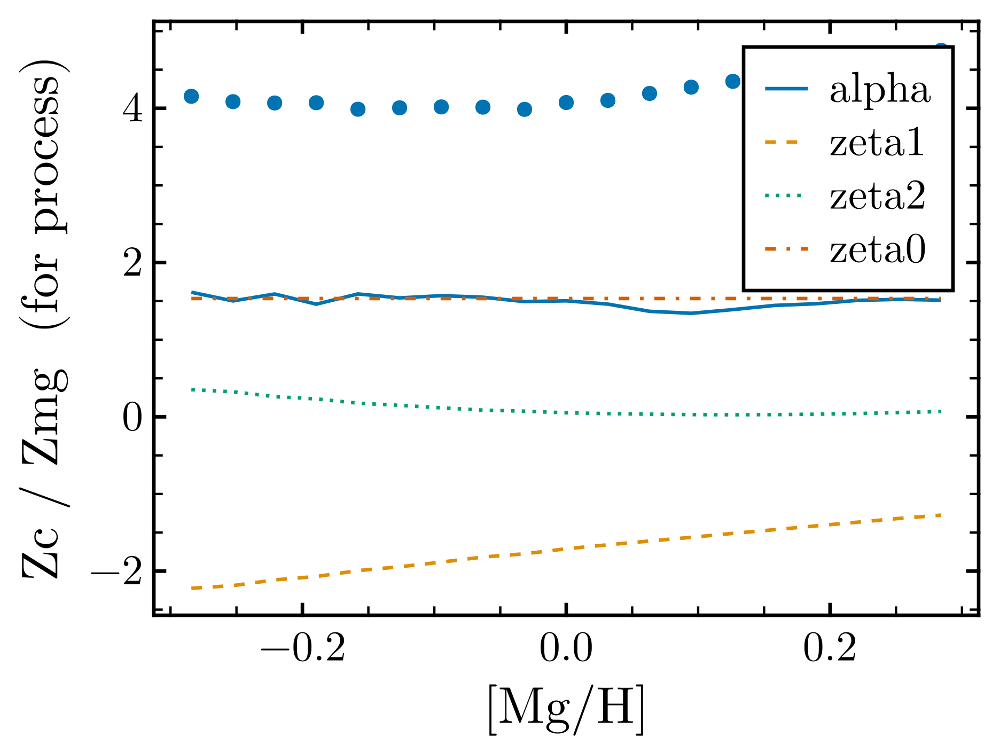

In [36]:
plot_ah_models(ah, labels)

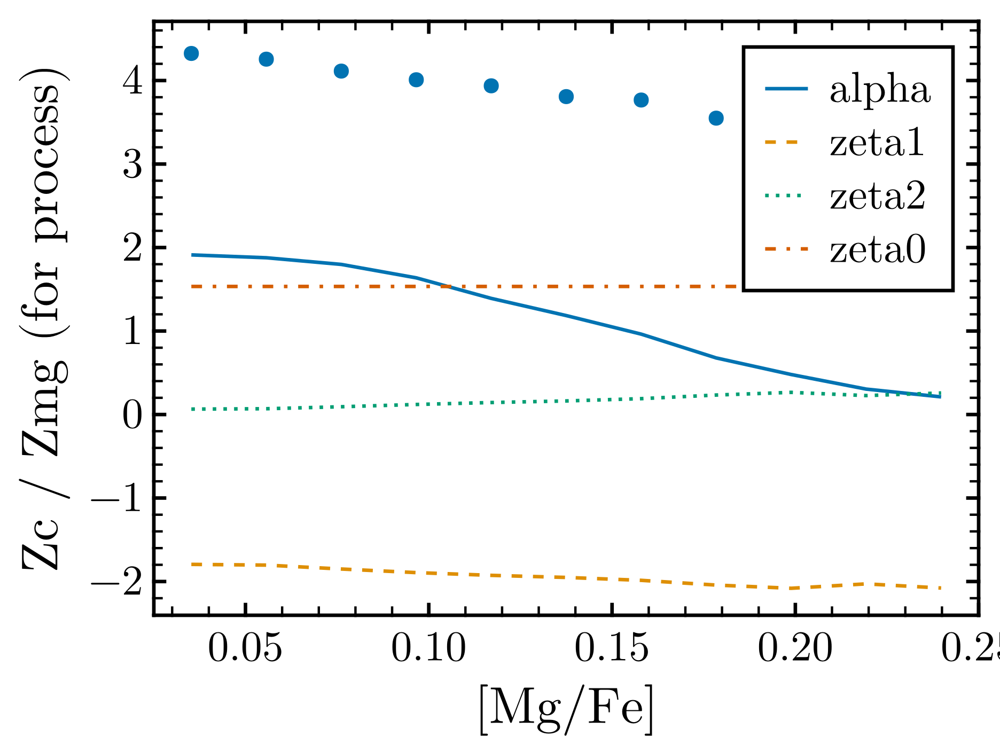

In [37]:
plot_afe_models(afe, labels)

## Plots

In [38]:
function plot_samples_ah!(samples, afe, labels;
        thin=10, color=:black, alpha=nothing, kwargs...)
    
    if alpha === nothing
        alpha = 1/size(samples, 1)^(1/3)
    end

    for sample in eachrow(samples)[1:thin:end]
        y = sum(sample["params[$i]"] * afe[:, label]  for (i, label) in enumerate(labels))
        
        lines!(afe.x, y, color=color, alpha=alpha)
    end

    errorscatter!(afe.x, afe.obs, yerror=afe.obs_err ./ sqrt.(afe.obs_counts), color=COLORS[2])
end

plot_samples_ah! (generic function with 1 method)

In [39]:
function plot_samples_ah(samples, ah, labels; thin=10)
    
    fig = Figure(rasterize=true)
    ax = Axis(fig[1, 1],
        xlabel="[Mg/H]",
        ylabel="mean Z_C / Zmg",
    )

    
    plot_samples_ah!(samples, ah, labels, thin=100)
    
    fig
end

plot_samples_ah (generic function with 1 method)

In [40]:
function plot_samples_caah!(samples, afe, labels;
        thin=10, color=:black, alpha=nothing, kwargs...)
    
    if alpha === nothing
        alpha = 1/size(samples, 1)^(1/3)
    end

    for sample in eachrow(samples)[1:thin:end]
        y = sum(sample["params[$i]"] * afe[:, label]  for (i, label) in enumerate(labels))
        
        lines!(afe.x, Zc_to_C_Mg.(y), color=color, alpha=alpha)
    end

    errorscatter!(afe.x, Zc_to_C_Mg.(afe.obs), yerror=afe.obs_err ./ afe.obs ./ sqrt.(afe.obs_counts) ./ log(10), color=COLORS[2])
end

plot_samples_caah! (generic function with 1 method)

In [41]:
function plot_samples_afe!(samples, afe, labels;
        thin=10, color=:black, alpha=nothing, kwargs...)
    
    if alpha === nothing
        alpha = 1/size(samples, 1)^(1/3)
    end
    
    for sample in eachrow(samples)[1:thin:end]
        y = sum(sample["params[$i]"] * afe[:, label]  for (i, label) in enumerate(labels))
        
        lines!(afe.x, y, color=color, alpha=alpha)
    end

    errorscatter!(afe.x, afe.obs, yerror=afe.obs_err ./ sqrt.(afe.obs_counts), color=COLORS[2])
end

plot_samples_afe! (generic function with 1 method)

In [42]:
function plot_samples_caah(samples, ah, labels; thin=100)
    fig = Figure()
    ax = Axis(fig[1, 1],
        xlabel="[Mg/H]",
        ylabel="mean Z_C / Zmg",
    )
    
    
    plot_samples_caah!(samples, ah, labels, thin=100)
    
    fig
end

plot_samples_caah (generic function with 1 method)

In [43]:
function plot_samples_afe(samples, afe, labels; thin=100)
    fig = Figure(rasterize=true)
    ax = Axis(fig[1, 1],
        xlabel="[Mg/Fe]",
        ylabel="mean Z_C",
    )
    
    
    plot_samples_afe!(samples, afe, labels, thin=100)
    
    fig
end

plot_samples_afe (generic function with 1 method)

In [44]:
"""
    plot_mcmc_results(chains; bins)

Plots the evolution of each chain for each parameter for the MCMC sampler
"""
function plot_mcmc_results(chain::Chains; bins::Int = 30)
    # Extract parameter names
    params = chain.name_map.parameters
    nparams = length(params)
    
    # Determine grid layout
    nrows = ceil(Int, nparams)
    
    # Initialize the figure
    fig = Figure(size = (600, 200 * nrows), 
                backgroundcolor = :white, rasterize=true)
    
    # Determine number of chains
    nchains = size(chain, 3)
        
    # Iterate over each parameter
    for (i, param) in enumerate(params)

        acc_rate = length(unique(chain[:, i, :])) / length(chain[:, i, :])
        @info "Param $param, acc rate $acc_rate"
        # Trace Plot
        ax_trace = Axis(fig[i, 1],
            xlabel = "Iteration",
            ylabel = "$param",
            xgridvisible=false,
            ygridvisible=false,
            )
        
        # Plot each chain's trace
        for c in 1:nchains
            samples = chain[:, i, c]
            lines!(ax_trace, collect(1:length(samples)), samples, color = c, colorrange=(0, nchains), label = "Chain $c")
        end
        
        # Add legend only once
        if i == 1 && nchains > 1
            axislegend(ax_trace, position = :rt)
        end
        
        # Histogram Plot
        ax_hist = Axis(fig[i, 2],
            limits=(0, nothing, nothing, nothing),
            xgridvisible=false,
            ygridvisible=false
        )
        hidedecorations!(ax_hist)
        linkyaxes!(ax_trace, ax_hist)

        
        # Combine samples from all chains for histogram
        combined_samples = vec(chain[:, i, :])
        hist!(ax_hist, direction=:x, combined_samples, bins = bins)
        
        if i < nparams
            hidexdecorations!(ax_trace, ticks=false)
        end
    end

    colgap!(fig.layout, 1, 0)
    rowgap!(fig.layout, 0)

    colsize!(fig.layout, 2, Relative(0.25))

    return fig
end

plot_mcmc_results

In [45]:
function plot_all(chain, ah, afe, labels; thin=10, burn=0)

    display(
        plot_mcmc_results(chain[burn+1:end]; bins=30)
    )
    
    fig = pairplot(chain[burn+1:end], labels=Dict(
            Symbol("params[$i]") => string(label) for (i, label) in enumerate(labels)
        )
    )
    display(fig)

    samples = DataFrame(chain[burn+1:end])

    display(
        plot_samples_ah(samples, ah, labels, thin=thin)
    )

    display(
        plot_samples_afe(samples, afe, labels, thin=thin)
    )


    return samples

end


plot_all (generic function with 1 method)

In [46]:
function write_binned(modelname, ah, afe)
    CSV.write("mcmc_samples/ah_$modelname.csv", ah)
    CSV.write("mcmc_samples/afe_$modelname.csv", afe)
end


write_binned (generic function with 1 method)

In [47]:
function write_model(modelname, samples, labels)
    df = rename(samples,
        Dict(Symbol("params[$i]") => labels[i] for i in eachindex(labels)))
    
    CSV.write("mcmc_samples/$modelname.csv", df)
end

write_model (generic function with 1 method)

# Chi2 model

In [74]:
@model function n_component_model(models_ah, models_afe, labels, priors)
    # Create parameters based on the specified priors
    params ~ arraydist(priors)
    
    # Compute model contributions for each dataset
    mu_ah = sum(p * models_ah[:, key] for (p, key) in zip(params, labels))
    mu_afe = sum(p * models_afe[:, key] for (p, key) in zip(params, labels))
    
    # Data likelihoods

    sigma_ah = models_ah.obs_err ./ sqrt.(models_ah.obs_counts)
    sigma_afe = models_afe.obs_err ./ sqrt.(models_afe.obs_counts)
    
    models_ah.obs ~ MvNormal(mu_ah, diagm(sigma_ah .^ 2))
    models_afe.obs ~ MvNormal(mu_afe, diagm(sigma_afe .^ 2))
end

n_component_model (generic function with 2 methods)

In [75]:
priors = Dict(
    :alpha => Normal(1, 6),
    :zeta0 => Normal(2, 6),
    :zeta1 => Normal(0, 6),
    :zeta2 => Normal(0, 6)
    )

Dict{Symbol, Normal{Float64}} with 4 entries:
  :alpha => Normal{Float64}(μ=1.0, σ=6.0)
  :zeta1 => Normal{Float64}(μ=0.0, σ=6.0)
  :zeta2 => Normal{Float64}(μ=0.0, σ=6.0)
  :zeta0 => Normal{Float64}(μ=2.0, σ=6.0)

In [76]:
labels = collect(keys(models))

4-element Vector{Symbol}:
 :alpha
 :zeta1
 :zeta2
 :zeta0

In [77]:
priors = [priors[label] for label in labels]

4-element Vector{Normal{Float64}}:
 Normal{Float64}(μ=1.0, σ=6.0)
 Normal{Float64}(μ=0.0, σ=6.0)
 Normal{Float64}(μ=0.0, σ=6.0)
 Normal{Float64}(μ=2.0, σ=6.0)

In [78]:
model = n_component_model(ah, afe, labels, priors
)

DynamicPPL.Model{typeof(n_component_model), (:models_ah, :models_afe, :labels, :priors), (), (), Tuple{DataFrame, DataFrame, Vector{Symbol}, Vector{Normal{Float64}}}, Tuple{}, DynamicPPL.DefaultContext}(Main.n_component_model, (models_ah = 19×16 DataFrame
 Row │ alpha    zeta1     zeta2      zeta0    alpha_err  alpha_counts  zeta1_e ⋯
     │ Float64  Float64   Float64    Float64  Float64    Int64         Float64 ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │ 1.61495  -2.22261  0.352415   1.53374  0.506293            190  0.07747 ⋯
   2 │ 1.50265  -2.18785  0.324161   1.53374  0.478495            197  0.07179
   3 │ 1.59239  -2.11407  0.261771   1.53374  0.479931            193  0.07721
   4 │ 1.46059  -2.07013  0.232436   1.53374  0.476803            302  0.07977
   5 │ 1.59306  -1.99358  0.176841   1.53374  0.371279            319  0.06734 ⋯
   6 │ 1.54183  -1.944    0.149154   1.53374  0.377432            394  0.06852
   7 │ 1.57061  -1.8834

### NUTS

In [79]:
chain = sample(model, NUTS(0.65), 10_000)

┌ Info: Found initial step size
└   ϵ = 0.003125
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:40


Chains MCMC chain (10000×16×1 Array{Float64, 3}):

Iterations        = 1001:1:11000
Number of chains  = 1
Samples per chain = 10000
Wall duration     = 53.9 seconds
Compute duration  = 53.9 seconds
parameters        = params[1], params[2], params[3], params[4]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

   params[1]    0.4850    0.0251    0.0004   3885.6598   4959.4543    1.0005   ⋯
   params[2]    1.3853    0.0381    0.0007   3425.1745   3889.1690    0.9999   ⋯
   params[3]    2.1429    0.1293    0.0021   3657.3861   4252.6917    0.9999   ⋯
   params[4]    3.6689    0.0407    0.0007   3671.6991   4058.1265    1.0000   ⋯
                            

[ Info: Param params[1], acc rate 0.9976
[ Info: Param params[2], acc rate 0.9976
[ Info: Param params[3], acc rate 0.9976
[ Info: Param params[4], acc rate 0.9976


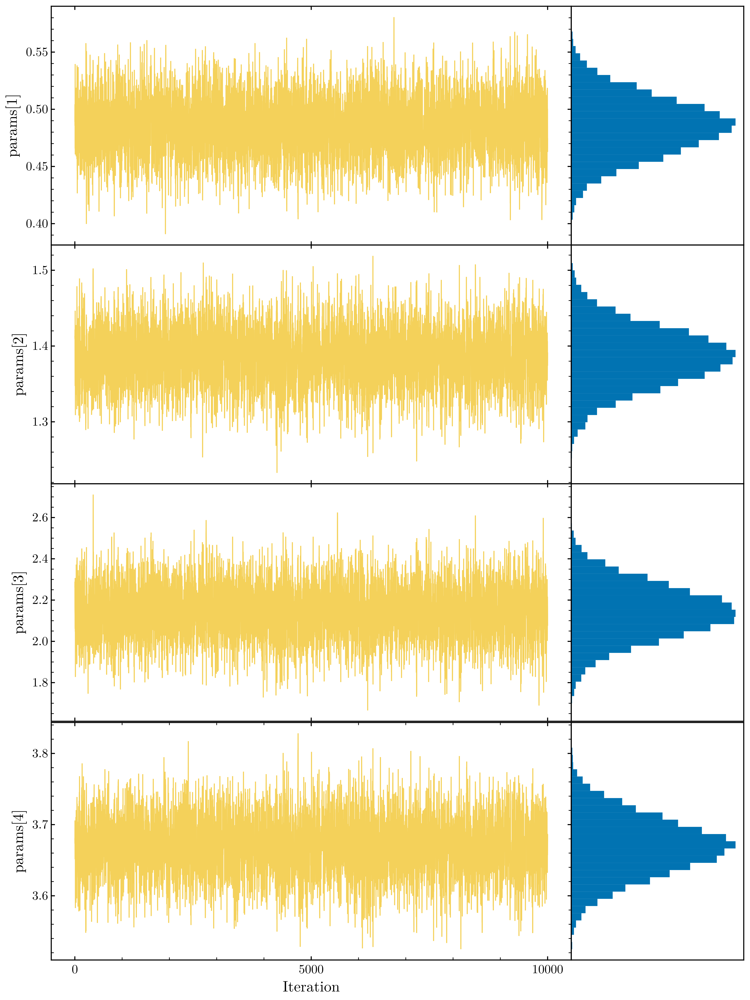

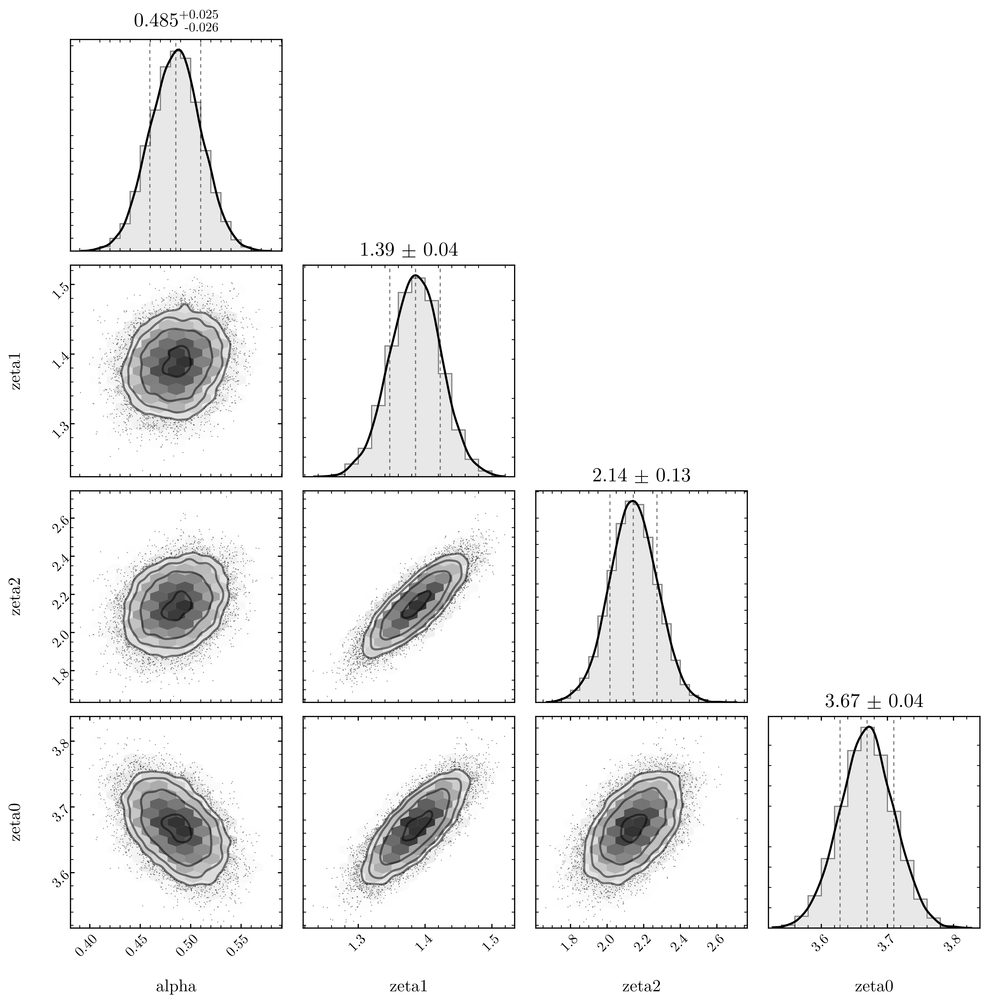

LoadError: UndefVarError: `errscatter!` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [80]:
samples = plot_all(chain, ah, afe, labels);

In [81]:
write_model("NUTS", samples, labels)

LoadError: UndefVarError: `samples` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

### HMC

In [ ]:
chain = sample(model, HMC(0.001, 10), 10_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels, burn=1000);

In [ ]:
write_model("HMC", samples, labels)

### RWMH

In [ ]:
using AdvancedMH: RWMH
using AdvancedMH

In [ ]:
s_walk = 0.003
rw_prop = RandomWalkProposal(MvNormal([0,0,0,0], s_walk * I))


In [ ]:
chain = sample(model, MH(rw_prop), 100_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels, burn=3000);

In [ ]:
write_model("RWMH", samples[1:10:end, :], labels)

## Both uncertanties

In [ ]:
@model function n_component_model_both(models_ah, models_afe, labels, priors)
    # Create parameters based on the specified priors
    params ~ arraydist(priors)
    
    # Compute model contributions for each dataset
    mu_ah = sum(p * models_ah[:, key] for (p, key) in zip(params, labels))
    mu_afe = sum(p * models_afe[:, key] for (p, key) in zip(params, labels))
    sem_ah = sum(p * models_ah[:, Symbol("$(key)_err")] ./ sqrt.(models_ah[:, Symbol("$(key)_counts")])  for (p, key) in zip(params, labels))
    sem_afe = sum(p * models_afe[:, Symbol("$(key)_err")] ./ sqrt.(models_afe[:, Symbol("$(key)_counts")]) for (p, key) in zip(params, labels))
    
    # Data likelihoods

    sigma_ah = models_ah.obs_err ./ sqrt.(models_ah.obs_counts)
    sigma_afe = models_afe.obs_err ./ sqrt.(models_afe.obs_counts)

    sigma2_ah = @. sigma_ah^2 + sem_ah^2 
    sigma2_afe = @. sigma_afe^2 + sem_afe^2 
    
    models_ah.obs ~ MvNormal(mu_ah, diagm(sigma2_ah))
    models_afe.obs ~ MvNormal(mu_afe, diagm(sigma2_afe))
end

In [ ]:
priors = Dict(
    :alpha => Normal(1, 1),
    :zeta0 => Normal(2, 1),
    :zeta1 => Normal(0, 1),
    :zeta2 => Normal(0, 2)
    )

In [ ]:
priors = [priors[label] for label in labels]

In [ ]:
model = n_component_model_both(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, NUTS(0.65), 10_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("both_sigma", samples, labels)

## Binning choices

In [ ]:
@model function n_component_model_both_sigma(models_ah, models_afe, labels, priors)
    # Create parameters based on the specified priors
    params ~ arraydist(priors)
    sigma_ah ~ LogNormal(-2, 1)
    sigma_afe ~ LogNormal(-2, 1)
    
    
    # Compute model contributions for each dataset
    mu_ah = sum(p * models_ah[:, key] for (p, key) in zip(params, labels))
    mu_afe = sum(p * models_afe[:, key] for (p, key) in zip(params, labels))
    sem_ah = sum(p * models_ah[:, Symbol("$(key)_err")] ./ sqrt.(models_ah[:, Symbol("$(key)_counts")])  for (p, key) in zip(params, labels))
    sem_afe = sum(p * models_afe[:, Symbol("$(key)_err")] ./ sqrt.(models_afe[:, Symbol("$(key)_counts")]) for (p, key) in zip(params, labels))
    
    # Data likelihoods

    sigma_ah = models_ah.obs_err ./ sqrt.(models_ah.obs_counts)
    sigma_afe = models_afe.obs_err ./ sqrt.(models_afe.obs_counts)

    sigma2_ah = @. sigma_ah^2 + sem_ah^2 .+ sigma_ah^2
    sigma2_afe = @. sigma_afe^2 + sem_afe^2  + sigma_afe^2
    
    models_ah.obs ~ MvNormal(mu_ah, diagm(sigma2_ah))
    models_afe.obs ~ MvNormal(mu_afe, diagm(sigma2_afe))
end

In [ ]:
function plot_bins(ah, afe, labels)
    display(
        plot_ah_models(ah, labels)
        )

    display(
        plot_afe_models(afe, labels)
        )

    fig, ax = FigAxis(
        xlabel = "[Mg/H]",
        ylabel = "counts")
    scatter!(ah.x, ah.obs_counts, label="observations")
    scatter!(ah.x, ah.alpha_counts, label = "models")
    axislegend()
    display(fig)

    fig, ax = FigAxis(
        xlabel = "[Mg/Fe]",
        ylabel = "counts")
    scatterlines!(afe.x, afe.obs_counts, label="observations")
    scatterlines!(afe.x, afe.alpha_counts, label = "models")

    axislegend()
    display(fig)

end

### More bins

In [ ]:
mg_h_bins = -0.5:0.05:0.3
mg_fe_bins = 0:0.025:0.3

In [ ]:
ah, afe, labels = bin_all(models, mg_h_bins=mg_h_bins, mg_fe_bins=mg_fe_bins)

In [ ]:
plot_bins(ah, afe, labels)

In [ ]:
model = n_component_model_both(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, NUTS(0.65), 10_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("fine_bins", samples, labels)

### Superfine bins

In [ ]:
mg_h_bins = -0.5:0.02:0.4
mg_fe_bins = 0.02:0.01:0.3

In [ ]:
ah, afe, labels = bin_all(models, mg_h_bins=mg_h_bins, mg_fe_bins=mg_fe_bins)

In [ ]:
plot_bins(ah, afe, labels)

#### Simple model

In [ ]:
model = n_component_model_both(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, NUTS(0.65), 10_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("superfine_bins", samples, labels)

#### + sigma

In [ ]:
model = n_component_model_both_sigma(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, NUTS(0.65), 1_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("superfine_bins_sigma", samples, labels)

### equal number bins

In [ ]:
mg_h_bins = quantile(model_alpha.MG_H_true[.!model_alpha.high_alpha], LinRange(0, 1, 30))
filt_z = model_alpha.MG_H_true .> MG_H_0 - D_MG_H
filt_z .&= model_alpha.MG_H_true .<= MG_H_0 + D_MG_H
mg_fe_bins = quantile(model_alpha.MG_FE_true[filt_z], LinRange(0, 1, 25));

In [ ]:
ah, afe, labels = bin_all(models, mg_h_bins=mg_h_bins, mg_fe_bins=mg_fe_bins)

In [ ]:
plot_bins(ah, afe, labels)

In [ ]:
model = n_component_model_both(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, NUTS(0.65), 10_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("equal_num_bins", samples, labels)

### more equal number bins

In [ ]:
model_alpha = models[:alpha]

In [ ]:
mg_h_bins = quantile(model_alpha.MG_H_true[.!model_alpha.high_alpha], LinRange(0, 1, 60))
filt_z = model_alpha.MG_H_true .> MG_H_0 - D_MG_H
filt_z .&= model_alpha.MG_H_true .<= MG_H_0 + D_MG_H
mg_fe_bins = quantile(model_alpha.MG_FE_true[filt_z], LinRange(0, 1, 50));

In [ ]:
quantile(model_alpha.MG_FE_true[filt_z], 0)

In [ ]:
ah, afe, labels = bin_all(models, mg_h_bins=mg_h_bins, mg_fe_bins=mg_fe_bins)

In [ ]:
plot_bins(ah, afe, labels)

In [ ]:
model = n_component_model_both(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, NUTS(0.65), 10_000)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("equalnum_fine", samples, labels)

## Not true values

In [ ]:
mg_h_bins = LinRange(-0.3, 0.3, 20)
mg_fe_bins = LinRange(0.025, 0.25, 12)

In [ ]:
ah, afe, labels = bin_all(models, mg_h_bins=mg_h_bins, mg_fe_bins=mg_fe_bins)

In [ ]:
plot_bins(ah, afe, labels)

In [ ]:
model = n_component_model_both(ah, afe, labels, priors
)

In [ ]:
chain = sample(model, DEFAULT_SAMPLER, N_SAMPLES)

In [ ]:
samples = plot_all(chain, ah, afe, labels)

In [ ]:
write_model("add_rand_scatter", samples, labels)

# Divergence methods

This section explores some much more computationally heavier but more sophisticated models using likelihoods of statistical divergences between probability distributions.

### Utilities & friends

In [ ]:
using PythonCall
emcee = pyimport("emcee")

In [ ]:
function get_simple_variables(model)
    model_labels = bijector(model, Val(true))[2]

    labels = Vector{Symbol, undef}()
    for label in keys(model_labels)
        idx = model_labels[key]
        @assert length(idx) == 1
        @assert length(idx[1]) == 1

        labels[idx[1][1]] = label
    end

    return labels
end
        


In [ ]:
function sample_emcee(model, steps; nwalkers=nothing, progress=true, kwargs...)
    model_labels = bijector(model, Val(true))[2]

    # these are a named tuple
    variables = keys(model_labels) |> collect
    # add up number of indicies in bijection for dimensionality
    ndim = sum(length(vcat(idxs...)) for idxs in model_labels)
    
    if nwalkers === nothing
        nwalkers = 2*ndim
    end
    
    function py_log_prob(theta)
        vars = (; [k => theta[model_labels[k]...] for k in variables]...)
        lp = logprior(model, vars)
        if isfinite(lp)
            lp += loglikelihood(model, vars)
        end
            
        return lp
    end

    # sample from prior for initial conditions
    samples_prior = sample(model, Prior(), nwalkers)
    p0 = samples_prior.value[:, 1:ndim, 1].data

    # python run
    sammy = emcee.EnsembleSampler(nwalkers, ndim, py_log_prob)
    sammy.run_mcmc(p0, steps; progress=progress, kwargs...)

    #convert back to julia object
    chain = pyconvert(Array{Float64}, sammy.get_chain())
    chain = permutedims(chain, (1, 3, 2)) # emcee orderes differently
    varnames = samples_prior.name_map.parameters
    chain = Chains(chain, varnames)

    return chain
end

In [ ]:
function bin_values_to_list(df::DataFrame; x::Symbol=:MG_H_true, bins = mg_h_bins, val::Symbol=:z_c)
    Nb = length(bins) - 1

    # Create bin identifiers for the x dimension
    x_bin = cut(df[!, x], bins, extend=missing, labels=1:Nb)

    # Filter out any rows with missing bin assignments
    filt = .!ismissing.(x_bin)
    df_filtered = copy(df[filt, :])
    df_filtered[!, :x_bin] = x_bin[filt]

    # Initialize a dictionary to store values for each bin
    bin_dict = Dict{Int, Vector{eltype(df[!, val])}}()
    for i in 1:Nb
        bin_dict[i] = Vector{eltype(df[!, val])}()
    end

    # Group the DataFrame by bins and populate the dictionary
    grouped = groupby(df_filtered, :x_bin)

    for group in grouped
        bin_number = first(group.x_bin)
        bin_dict[bin_number] = group[!, val] |> collect
    end

    return [bin_dict[i] for i in 1:Nb]
end

In [ ]:
function bin_zc_afe_list(df::DataFrame; m_h=:MG_H_true, m_h_0=mg_h_0, d_m_h=d_mg_h, x=:MG_FE_true, val=:z_c, bins=mg_fe_bins, kwargs...)
    filt = df[:, m_h] .>= m_h_0 - d_m_h
    filt .&= df[:, m_h] .< m_h_0 + d_m_h
    return bin_values_to_list(df[filt, :]; bins=bins, x=x, val=val, kwargs...)
end

In [ ]:
function bin_zc_ah_list(df::DataFrame;x=:MG_H_true, val=:z_c, bins=mg_h_bins, kwargs...)
    filt = .!df.high_alpha
    return bin_values_to_list(df[filt, :]; bins=bins, x=x, val=val, kwargs...)
end

In [ ]:
function bin_all_to_list(models, observations=subgiants;
        mg_h_bins=BINS_MG_H, mg_fe_bins=BINS_MG_FE, 
        mg_h_0=MG_H_0, d_mg_h=D_MG_H
    )

    labels = keys(models) |> collect

    ah_dfs = Dict(label => bin_zc_ah_list(model, bins=mg_h_bins) 
        for (label, model) in models)
    
    afe_dfs = Dict(label => bin_zc_afe_list(model, bins=mg_fe_bins, 
            m_h_0=mg_h_0, d_m_h=d_mg_h) 
        for (label, model) in models)

    ah_dfs[:obs] = bin_zc_ah_list(observations, bins=mg_h_bins, x=:MG_H, val=:z_c) .|> sort
    afe_dfs[:obs] = bin_zc_afe_list(observations, bins=mg_fe_bins, 
        val=:z_c, x=:MG_FE, m_h=:MG_H,
            m_h_0=mg_h_0, d_m_h=d_mg_h) .|> sort

    

    idx_ah = [sortperm(df) for df in ah_dfs[labels[1]]]
    idx_afe = [sortperm(df) for df in afe_dfs[labels[1]]]

    for label in labels
        ah_dfs[label] = [df[idx] for (df, idx) in zip(ah_dfs[label], idx_ah)]
        afe_dfs[label] = [df[idx] for (df, idx) in zip(afe_dfs[label], idx_afe)]

    end

    
    return ah_dfs, afe_dfs
end

In [ ]:
ah_list, afe_list = bin_all_to_list(models);

In [ ]:
labels = keys(models) |> collect

In [ ]:
fig = Figure()
ax = Axis(fig[1,1])

for label in [labels; :obs]
    ys = []
    N = length(ah_list[label])
    
    for i in 1:N
        push!(ys, mean(ah_list[label][i]))
    end

    scatter!(1:N, ys, label=string(label))
        
end

axislegend()
fig

In [ ]:
fig = Figure()
ax = Axis(fig[1,1])

i = 3
for label in labels
    stephist!(ah_list[label][i], label=string(label))
end

axislegend()
fig

In [ ]:
fig = Figure()
ax = Axis(fig[1,1])

i = 6
for label in labels
    stephist!(afe_list[label][i], label=string(label))
end

axislegend()
fig

In [ ]:
using HypothesisTests

In [ ]:
@model function  divergence_model(models_ah, models_afe, labels, priors, p_func)
    # Create parameters based on the specified priors
    params ~ arraydist(priors)
    
    ah_obs = models_ah[:obs]
    afe_obs = models_afe[:obs]

    Nb_ah = length(ah_obs)

    LLtot = 0
    for i in 1:Nb_ah
        ah_pred = sum(p * models_ah[key][i] for (p, key) in zip(params, labels)) 
        obs = ah_obs[i]
        L = p_func(obs, ah_pred)
        @Turing.addlogprob!(L)

        LLtot += (L)
    end

    Nb_afe = length(afe_obs)

    for i in 1:Nb_afe
        afe_pred = sum(p * models_afe[key][i] for (p, key) in zip(params, labels))
        obs = afe_obs[i]

        L = p_func(obs, afe_pred)
        @Turing.addlogprob!(L)
        
        LLtot += (L)
    end

    
end

In [ ]:
priors = Dict(
    :alpha => Normal(1, 1),
    :zeta0 => Normal(2, 1),
    :zeta1 => Normal(1, 0.5),
    :zeta2 => Normal(2, 0.5)
    )

In [ ]:
labels = keys(models) |> collect

In [ ]:
priors = [priors[label] for label in labels]

### Mean

In [ ]:
metric(x, y) = -(mean(x) - mean(y))^2 / ((sem(y))^2 + (sem(x))^2)

In [ ]:
priors = Dict(
    :alpha => Normal(0.5, 0.25),
    :zeta0 => Normal(2, 0.25),
    :zeta1 => Normal(2, 0.5),
    :zeta2 => Normal(2, 0.5)
    )

priors = [priors[label] for label in labels]

In [ ]:
model = divergence_model(ah_list, afe_list, labels, priors,  metric);

In [ ]:
s_walk = 0.005
rw_prop = RandomWalkProposal(MvNormal([0,0,0,0], s_walk^2 * I))


In [ ]:
chain = sample(model, MH(rw_prop), 100_000)

In [ ]:
#chain = sample_emcee(model, 3_000, nwalkers=32)

In [ ]:
#chain_filt = @. 0 .< chain[end, 1, :] .< 3

In [ ]:
samples = plot_all(chain, ah, afe, labels, burn=10_000)

### T test

In [ ]:
metric(x, y) = log(pvalue(OneSampleTTest(x, median(y))))

In [ ]:
model = divergence_model(ah_list, afe_list, labels, priors,  metric);

Gradient-based samplers (at least NUTS) struggle in performace with this model, likely because of vector sorting / etc. I believe the only non-gradient models are PG and MH (and Gibbs of those two), so lets just use PG for now.

In [ ]:
chain = sample_emcee(model, 3_000, nwalkers=16)

In [ ]:
chain_filt = @. 0 .< chain[end, 1, :] .< 3

In [ ]:
samples = plot_all(chain[:, :, chain_filt], ah, afe, labels, burn=300)

In [ ]:
write_model("t_test", samples, labels)

### U model

In [ ]:
metric(x, y) = log(pvalue(MannWhitneyUTest(x, y)))

In [ ]:
ah_list

In [ ]:
@time metric(ah_list[:alpha][1], ah_list[:zeta1][1])

In [ ]:
model = divergence_model(ah_list, afe_list, labels, priors,  metric);

Gradient-based samplers (at least NUTS) struggle in performace with this model, likely because of vector sorting / etc. I believe the only non-gradient models are PG and MH (and Gibbs of those two), so lets just use PG for now.

In [ ]:
chain = sample_emcee(model, 3000, nwalkers=16)

In [ ]:
chain_filt = @. 0 .< chain[end, 1, :] .< 3

In [ ]:
samples = plot_all(chain[:, :, chain_filt], ah, afe, labels, burn=300)

In [ ]:
write_model("utest", samples, labels)

### KS test (hypothesistest)

In [ ]:
metric(x, y) = log(pvalue(HypothesisTests.ApproximateTwoSampleKSTest(x, y)))


In [ ]:
model = divergence_model(ah_list, afe_list, labels, priors,  metric);

In [ ]:
@time [metric(ah_list[:alpha][i], ah_list[:zeta0][i]) for i in eachindex(ah_list[:alpha])]

Gradient-based samplers (at least NUTS) struggle in performace with this model, likely because of vector sorting / etc. I believe the only non-gradient models are PG and MH (and Gibbs of those two), so lets just use PG for now.

In [ ]:
s_walk = 0.008
rw_prop = RandomWalkProposal(MvNormal([0,0,0,0], s_walk^2 * I))


In [ ]:
chain = sample(model, MH(rw_prop), MCMCThreads(), 10_000, 16)

In [ ]:
#chain = sample_emcee(model, 1000, nwalkers=16)

In [ ]:
chain_filt = dropdims(mean(chain[:, 1, :], dims=1).data .> 0, dims=1)

In [ ]:
chain_filt = @. 0 .< chain[end, 1, :] .< 3

In [ ]:
samples = plot_all(chain[:, :, chain_filt], ah, afe, labels, burn=2000)

In [ ]:
write_model( "ks_test", samples[1:10:end, :])